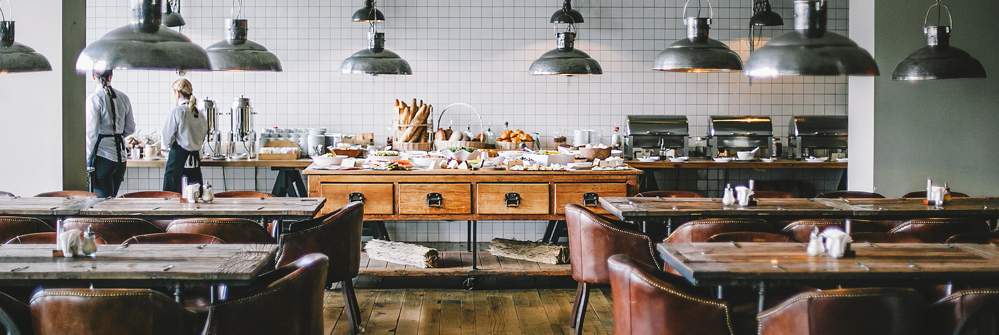

# Exploratory Data Analysis on Dining Culture in Toronto, Ontario

## Background

Toronto is renowned for its excellent culinary diversity. As a food enthusiast, I'd love to dive deeper into the local dining culture and explore characteristics of restaurants in Toronto with statistical and geospatial analysis. 

   - What are the most popular categories of restaurants?
   - What are the highest rated cuisines?
   - Where are the most expensive restaurants?
   - Which city ward has the most restaurants? 


I will be using data collected from Yelp API and an online dataset to answer the above questions.

Thanks for reading my project! 

## Table of Contents
### [Gathering and Importing Data](#) 
### [Data Preparation](#Data-Preparation) 
### [Summary Statistics](#Summary-Statistics)
### [Categorical Data Analysis](#Categorical-Data-Analysis)
### [Visualizing Geographic Information](#Visualizing-Geographic-Information)

# Gathering and Importing Data

## Obtaining Data from Yelp API and Online Dataset
Code used for data collection has been uploaded to this github repository. Note that the dataset was partially collected from Yelp API. However, Yelp API does not return any restaurants without user review. Thus, an online dataset was also used, which contains Toronto restaurant data scraped directly from the Yelp website.

The online dataset generated by Stephanie O'Gay Garcia can be found [here](https://public.tableau.com/profile/stephanie.o.gay.garcia#!/vizhome/TorontoRestaurants/TorontoRestaurantsByCategory).

## Importing Data
Two datasets: toronto_restaurants.json and trt_rest.csv will be imported into the notebook. The first dataset is collected from Yelp API and the second is the online dataset.

In [85]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
sns.set(color_codes=True)
warnings.filterwarnings('ignore')

In [86]:
df = pd.read_json('toronto_restaurants.json') # Yelp API data
df.head()

,id,alias,name,image_url,is_closed,url,review_count,categories,rating,coordinates,transactions,location,phone,display_phone,distance,price
0,MvNRA9k-xF9ug5gXZexPog,naan-and-kabob-toronto-7,Naan And Kabob,https://s3-media1.fl.yelpcdn.com/bphoto/Ep44lN...,False,https://www.yelp.com/biz/naan-and-kabob-toront...,15,"[{'alias': 'afghani', 'title': 'Afghan'}]",4.5,"{'latitude': 43.7049057279802, 'longitude': -7...",[],"{'address1': '62 Laird Drive', 'address2': '',...",+16473523544,+1 647-352-3544,4438.947771,NaN
1,GdCRQU3VCh_x8fY84mbwYQ,bamiyan-kabob-east-york,Bamiyan Kabob,https://s3-media3.fl.yelpcdn.com/bphoto/-gnYpm...,False,https://www.yelp.com/biz/bamiyan-kabob-east-yo...,148,"[{'alias': 'afghani', 'title': 'Afghan'}]",4.0,"{'latitude': 43.70779, 'longitude': -79.34344}",[],"{'address1': '62 Overlea Boulevard', 'address2...",+14164297514,+1 416-429-7514,5697.138730,$$
2,VtQIAj8eXvHqc_8MtMMGwg,afghan-cuisine-toronto,Afghan Cuisine,https://s3-media3.fl.yelpcdn.com/bphoto/OYPhdO...,False,https://www.yelp.com/biz/afghan-cuisine-toront...,45,"[{'alias': 'afghani', 'title': 'Afghan'}]",4.0,"{'latitude': 43.70805, 'longitude': -79.34294}",[],"{'address1': '66 Overlea Boulevard', 'address2...",+14164225858,+1 416-422-5858,5765.339158,$$
3,VDhLScy4FneNi9LcVOg-aQ,shawarma-q-toronto-2,Shawarma Q,https://s3-media3.fl.yelpcdn.com/bphoto/9WR0ch...,False,https://www.yelp.com/biz/shawarma-q-toronto-2?...,11,"[{'alias': 'afghani', 'title': 'Afghan'}]",4.5,"{'latitude': 43.68725, 'longitude': -79.3968}",[],"{'address1': '55 St Clair Avenue W', 'address2...",+16474307266,+1 647-430-7266,1435.368552,NaN
4,yU4zevCwPAQIMb73smTHog,bamiyan-kabob-toronto,Bamiyan Kabob,https://s3-media3.fl.yelpcdn.com/bphoto/HgzUBm...,False,https://www.yelp.com/biz/bamiyan-kabob-toronto...,83,"[{'alias': 'afghani', 'title': 'Afghan'}]",4.0,"{'latitude': 43.77361, 'longitude': -79.4920999}",[],"{'address1': '4205 Keele St', 'address2': '', ...",+14166500111,+1 416-650-0111,13458.817441,$$


In [87]:
df2 = pd.read_csv('trt_rest.csv') # online dataset
df2.head()

,Category,Restaurant Address,Restaurant Name,Restaurant Phone,Restaurant Price Range,Restaurant Website,Restaurant Yelp URL,Restaurant Latitude,Restaurant Longitude
0,Afghan,"14 Prince Arthur Avenue\nToronto, ON M5R 1A9",The Host,(416) 962-4678,$11-30,welcometohost.com,https://www.yelp.ca/adredir?ad_business_id=OFA...,43.669935,-79.395858
1,Afghan,"259 Wellington St W\nToronto, ON M5V",Aanch Modernist Indian Cuisine,(647) 558-1508,$11-30,aanch.ca,https://www.yelp.ca/adredir?ad_business_id=SZu...,43.644708,-79.390670
2,Afghan,"736 Bay Street\nToronto, ON M5G 2J8",Silk Road Kabob House,NaN,Under $10,NaN,https://www.yelp.ca/biz/silk-road-kabob-house-...,43.659816,-79.385591
3,Afghan,"691 Yonge Street\nToronto, ON M4Y 2B2",Naan & Kabob,(416) 972-6623,$11-30,naanandkabob.ca,https://www.yelp.ca/biz/naan-and-kabob-toronto-5,43.669058,-79.386100
4,Afghan,"66 Overlea Boulevard\nUnit 62\nToronto, ON M4H...",Afghan Cuisine,(416) 422-5858,$11-30,afghancuisinerestaurant.com,https://www.yelp.ca/biz/afghan-cuisine-toronto,43.708070,-79.341508


In [88]:
df.shape

(5757, 16)

In [89]:
df2.shape

(15821, 9)

By examining the first five rows of the datasets, we found they have the following common variables:
- restaurant category
- address and name 
- coordinate 
- price range


However, only the Yelp API dataset has information on review counts and ratings. Note that the difference between the number of rows in two dataset is quite dramatic. This is because the Yelp API dataset groups multiple categories of a restaurant into one row, while the online dataset has been expanded to have each row represents each category of the same restaurant.

Let's take a closer look at the datasets with no duplicates in df2:

In [90]:
df.name.value_counts().nlargest(10)

Subway                       98
McDonald's                   63
Tim Hortons                  63
Pizza Pizza                  57
Freshii                      42
Popeyes Louisiana Kitchen    35
Pizza Nova                   33
A&W                          32
Domino's Pizza               26
Pizzaiolo                    26
Name: name, dtype: int64

In [91]:
# remain only one category for each restaurant 
df2.drop_duplicates(subset=['Restaurant Name', 'Restaurant Address'], 
                    keep='first')['Restaurant Name'].value_counts().nlargest(10)

Subway                             153
Pizza Pizza                        105
Tim Hortons                        100
McDonald’s                          94
Pizza Nova                          53
KFC                                 51
Popeyes Louisiana Kitchen           41
Swiss Chalet Rotisserie & Grill     35
Freshii                             34
Domino’s Pizza                      32
Name: Restaurant Name, dtype: int64

In [92]:
df2.drop_duplicates(subset=['Restaurant Name', 'Restaurant Address'], keep='first')['Restaurant Name'].shape

(8656,)

In [93]:
df.shape

(5757, 16)

Now we can see that the online dataset has about 3000 more restaurants than the API dataset. Since the API do not return restaurants without any review, it is expected that online dataset will contain more restaurants. Now that we have two datasets loaded, let's clean the data and bring them together!  

# Data Preparation

Data pre-processing is vital for combining two datasets together. In this section, we will perform several actions:

    1) Remove, simplify, and replace redundant information and column features
    2) Some restaurant has a "list" of categories; convert them into separate row entries 
    3) Remove duplicates and concatenate two datasets for future analysis 


In [94]:
# Remove Unnecessary Columns

df.drop(columns=['image_url','is_closed','transactions','phone','display_phone', 'id', 'alias'], inplace=True)

df2.drop(columns=['Restaurant Phone','Restaurant Website','Restaurant Yelp URL'], inplace=True)
df2.rename(columns={'Restaurant Price Range': 'price', 'Restaurant Address': 'full address', 
                    'Restaurant Latitude': 'latitude',
                    'Restaurant Longitude': 'longitude',
                    'Category': 'category',
                    'Restaurant Name': 'name'}, inplace=True)

df.replace(['$','$$','$$$','$$$$'],[1.0,2.0,3.0,4.0], inplace=True)
df2.replace(['Under $10','$11-30','US$11-30','$31-60','Above $61'],[1.0,2.0,2.0,3.0,4.0], inplace=True)

In [95]:
# Develop function for extracting categories

def category_simplifier(row):
    '''each row contains a list with one or more dictionaries
    return all alias(categories) within dictionaries in a list'''
    
    title_list = []
    for dic in row:
        title_list.append(dic['title'])

    return title_list

In [96]:
# Simplify Columns

df['categories_simp'] = df['categories'].apply(category_simplifier)
df['address'] = df['location'].apply(lambda x: x['address1'])
df['latitude'] = df['coordinates'].apply(lambda x: x['latitude'])
df['longitude'] = df['coordinates'].apply(lambda x: x['longitude'])

df2['address'] = df2['full address'].apply(lambda x: str(x).split('\n')[0])

In [97]:
# Convert listed categories into a series which will be joined to existing dataset

# reference code url: https://stackoverflow.com/questions/27263805/pandas-column-of-lists-create-a-row-for-each-list-element
# df_expanded will be used for visualization of categorical variables

cat = df.apply(lambda x: pd.Series(x['categories_simp']),axis=1).stack().reset_index(level=1, drop=True)
df_expanded = df.copy()
cat.name = 'category'
df_expanded = df_expanded.drop('categories_simp', axis=1).join(cat)

In [98]:
df_expanded.shape

(10391, 13)

In [99]:
# Eliminate duplicated information with the same category, address, and name

df_expanded.drop_duplicates(subset=['category', 'address', 'name'], keep='last', inplace=True)
df2.drop_duplicates(subset=['category', 'address', 'name'], keep='last', inplace=True)

df_expanded.replace("Tim Horton's", "Tim Horton", inplace=True)
df2.replace("Tim Horton's", "Tim Horton", inplace=True)

df_expanded.replace(['Naan And Kabob', 'Naan & Kabob'], "Naan and Kabob", inplace=True)
df2.replace(['Naan And Kabob', 'Naan & Kabob'], "Naan and Kabob", inplace=True)

Now that we have two expanded dataframe with no duplicated value, we are ready to concatenate them into a bigger dataframe.  Since there is a significant overlapping of restaurants between df_expanded and df2, duplicates will be dropped. It is important to pay attention to the order that they will be joined with. Because only df_expanded contains rating and review count information, we'd like to keep those information in the final dataframe

In [100]:
# df3_expanded will be the concatenated dataframe 

frame = [df_expanded, df2]
df3_expanded = pd.concat(frame)

In [101]:
# drop duplicates between df_expanded and df2, keep='first' makes sure that we will keep data in df_expanded

df3_expanded.drop_duplicates(subset=['name', 'address','category'], keep='first', inplace=True)
df3_expanded.shape

(18843, 14)

In [102]:
df3_expanded.replace(['Dim Sum'], "Chinese", inplace=True)

In [103]:
df3_expanded.rating.value_counts() == df_expanded.rating.value_counts()

4.0    True
3.5    True
3.0    True
4.5    True
2.5    True
2.0    True
5.0    True
1.0    True
1.5    True
0.0    True
Name: rating, dtype: bool

**Number of ratings between df3 and df_expanded are identical. Nice!**

Another dataframe call df3 will be generated below. This dataframe aims to capture the total number of restaurants in the final dataset. Thus, separte entries for every category of a restaurant will be dropped, remaining only one row for each restaurant.

In [105]:
# df3 remains only one category per restaurant 
# It will be used for mapping restaurant density and total number

df3 = df3_expanded.drop_duplicates(subset=['name', 'address'], keep='last')
df3.shape

(10910, 14)

Yelp API only returned 5757 unique restaurans, now df3 has increased the sample size to 10910 unique restaurants. Though only half of them have information on rating and review count, the combined dataset can still give us more information on the distribution of prices and categories in Toronto.

Here is the quick breakdown of restaurants by price:

In [106]:
df3.price.value_counts()

2.0    4130
1.0    2286
3.0     479
4.0      79
Name: price, dtype: int64

Although an accurate estimation of the total number of restaurants in the GTA was not available online, the dataset contains data scraped from the Yelp website, which should contain a majority of the total restaurants in Toronto and nearby municipalities. This data should suffice our analysis for now.

# Summary Statistics
In this section, df3 will be used for visualizing numerical variables.

In [107]:
df3.describe()

,review_count,rating,distance,price,latitude,longitude
count,5535.000000,5535.000000,5535.000000,6974.000000,10858.000000,10858.000000
mean,51.395303,3.422584,5497.871783,1.763550,43.694568,-79.404844
std,102.274496,0.900355,4031.213319,0.621233,0.061460,0.083569
min,0.000000,0.000000,19.464227,1.000000,42.971988,-81.262466
25%,4.000000,3.000000,2695.879100,1.000000,43.652048,-79.444594
50%,17.000000,3.500000,3859.509250,2.000000,43.671894,-79.397775
75%,56.000000,4.000000,7785.135384,2.000000,43.740248,-79.366200
max,2863.000000,5.000000,40134.405033,4.000000,44.069601,-78.677382


In [108]:
print('Percentage of missing price: ' + str(round(df3.price.isnull().sum()/len(df3) * 100, 1)) + '%')
print('Percentage of missing rating and review count: ' + str(round(df3.rating.isnull().sum()/len(df3) * 100, 1)) + '%')

Percentage of missing price: 36.1%
Percentage of missing rating and review count: 49.3%


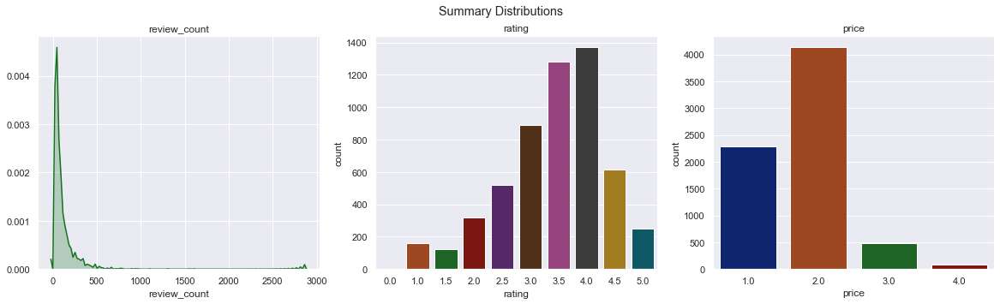

In [109]:
fig, axes = plt.subplots(1,3,figsize=(20,5))
sns.set(style="ticks", palette="dark")
sns.distplot(df3['review_count'], hist=False, color="g", ax=axes[0], kde_kws={"shade": True}).set_title('review_count')
sns.countplot(df3['rating'],ax=axes[1]).set_title('rating')
sns.countplot(df3['price'],ax=axes[2]).set_title('price')
fig.suptitle('Summary Distributions')
plt.show()

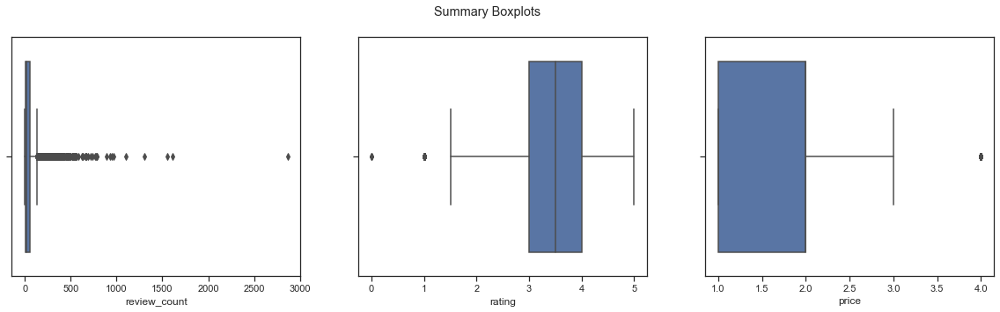

In [110]:
fig, ax =plt.subplots(1,3,figsize=(20,5))

sns.set(style="ticks", palette="deep")
sns.boxplot(x="review_count",
            data=df3,
            ax=ax[0])

sns.boxplot(x="rating",
            data=df3,
            ax=ax[1])

sns.boxplot(x="price",
            data=df3,
            ax=ax[2])

fig.suptitle('Summary Boxplots')
plt.show()

Distribution for review counts is heavily right-skewed. Some extraordinarily popular restaurants have more than 500 reviews while the mean number of review is approximately 100. 

Looking at the rating distribution, despite some outliers that receive mostly negative reviews, most of the restaurants are rated between 3.0 and 4.0. 

Though price distribution indicates that a majority of restaurants in Toronto are reasonably priced, Toronto still offer about 500 restaurants (with 3.0 and 4.0 price rating) across city that provide more upscale dining experience.

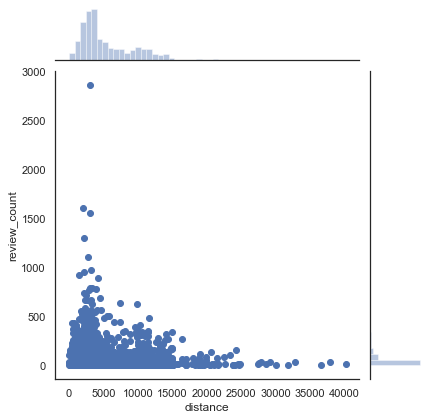

In [111]:
sns.set(style="white", palette="deep")
sns.jointplot(x="distance", y="review_count", data=df3)
plt.show()

In terms of spatial distribution, most of the restaurants are located within approximately 5km around downtown Toronto, and they generally have more reviews by customers.

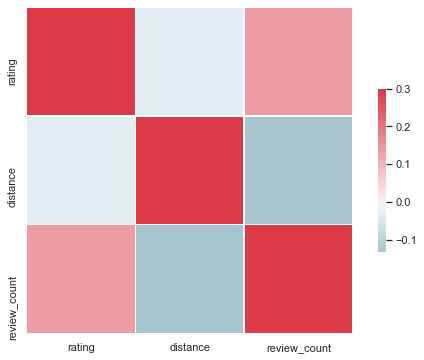

In [112]:
# Use seaborn to plot the correlation matrix

import numpy as np

sns.set(style="white")
data = df3[['rating', 'distance', 'review_count']]

corr = data.corr()


f, ax = plt.subplots(figsize=(9, 6))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(corr, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()

The correlation matrix indicates that there's slight relationship between the three numerical variables. 

# Categorical Data Analysis

Now we will use the method of Bayesian Average to estimate the mean values for price and rating by each restaurant category.

In [113]:
df3_expanded.columns

Index(['name', 'url', 'review_count', 'categories', 'rating', 'coordinates',
       'location', 'distance', 'price', 'address', 'latitude', 'longitude',
       'category', 'full address'],
      dtype='object')

### Formula used for Bayesian Average

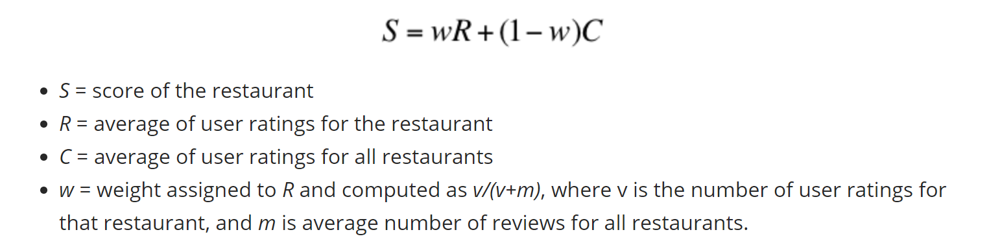

In [114]:
def bayes_avg(df,cond,col):
    """
    This function was taken from Heidi Jiang's "New Porkers" project
    See: https://github.com/heidijiang/new-porkers/
    
    v = number of review for each category
    m = average review/price for all restaurants
    
    """
    v = df.groupby(cond)[col].size()
    m = df[cond].value_counts().mean()
    w = v/(v+m)
    S = w*df.groupby(cond)[col].mean() + (1-w)*df[col].mean()
    return S

In [115]:
n = 20

# Average Price
price = (bayes_avg(df3_expanded, 'category', 'price').sort_values(ascending=False)
     .reset_index().sort_values('price', ascending=False))
price = price.dropna().iloc[:n]

# Average Rating
rating = (bayes_avg(df3_expanded, 'category', 'rating').sort_values(ascending=False)
     .reset_index().sort_values('rating', ascending=False))

rating = rating.iloc[:n]

# Review Count
review = (bayes_avg(df3_expanded, 'category', 'review_count').sort_values(ascending=False)
     .reset_index().sort_values('review_count', ascending=False))
review = review.iloc[:n]

# Total Count
total = df3_expanded.groupby('category')['name'].count().sort_values(ascending=False).reset_index()
total = total.rename(columns={'name': 'total_count'}) 
total = total.iloc[:n]

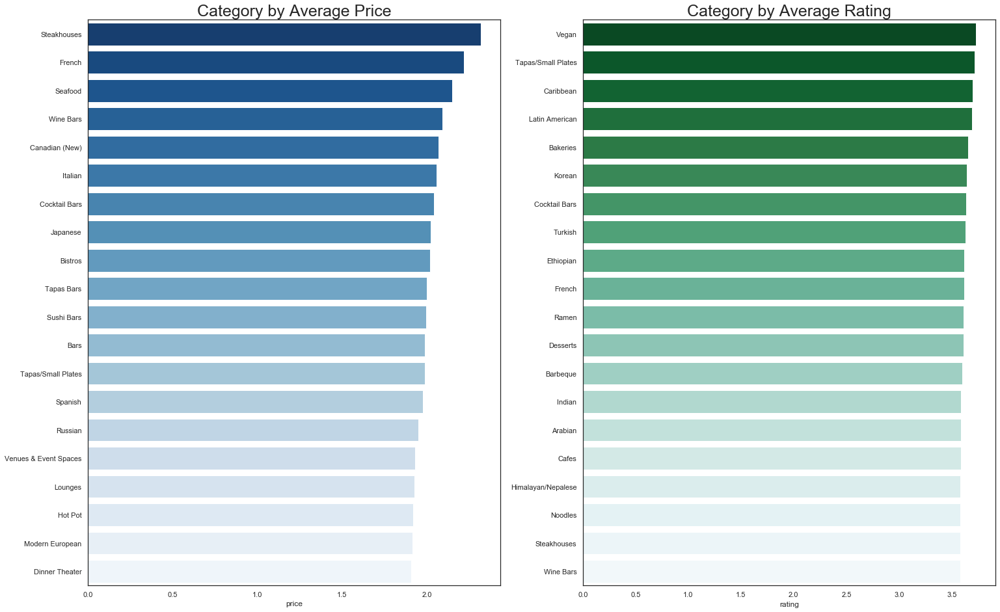

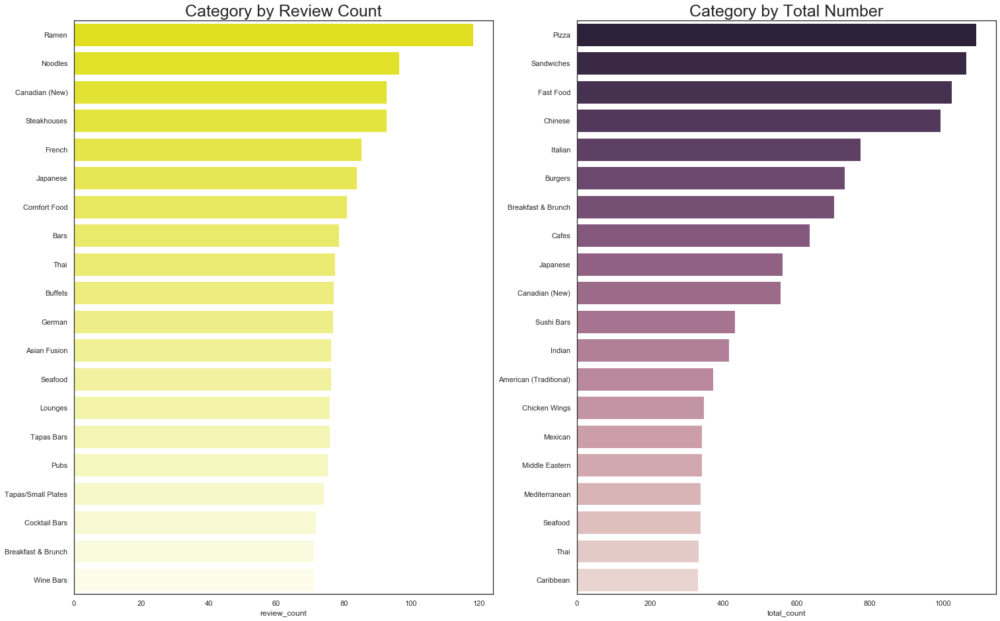

In [116]:
# first fig
fig, axes = plt.subplots(1,2,figsize=(25, 16))
# sns.set_palette(sns.cubehelix_palette(8))
sns.set(style="white", palette="deep")
sns.barplot(data=price,x='price',y='category',orient='h',ax=axes[0], palette="Blues_r").set_title('Category by Average Price', fontsize=25)
axes[0].set_ylabel('')

sns.barplot(data=rating,x='rating',y='category',orient='h',ax=axes[1], palette="BuGn_r").set_title('Category by Average Rating', fontsize=25)
axes[1].set_ylabel('')

# second fig
fig, axes = plt.subplots(1,2,figsize=(25, 16))
sns.set_palette('ch:8')

sns.barplot(data=review,x='review_count',y='category',orient='h',ax=axes[0], palette=sns.light_palette("yellow", n_colors=n, reverse=True)).set_title('Category by Review Count', fontsize=25)
axes[0].set_ylabel('')

sns.barplot(data=total,x='total_count',y='category',orient='h',ax=axes[1], palette=sns.cubehelix_palette(n, reverse=True)).set_title('Category by Total Number', fontsize=25)
axes[1].set_ylabel('')

plt.show()


Below is a summary of the top five categories for each plot in above:

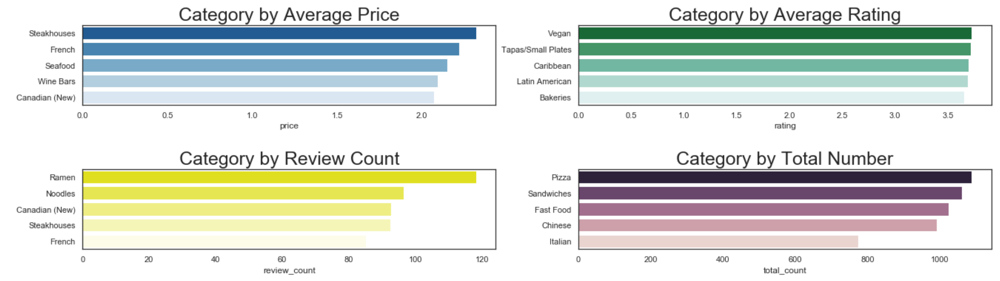

It is expected that steak, french and seafood will be among the most expensive cuisines, but in fact New Canadian cuisines are relatively pricy! It's suprising that vegetarian food is the most highly rated category in Toronto, along with Tapas, Caribbean and Latin American cuisine. 

Torontonians love visiting and reviewing ramen and noodle restaurants. Having a bowl of hot and tasty ramen is definitely satisfying in Toronto's harsh winter. Ramen restaurants are usually have attentive service and nice interior design, offering customers immersive dining experience. Gererally, restuarants with good dining environment and service will receive more reviews.

Other than fast food chains, Chinese cuisine has the most largest number of restaurants in Toronto. However, there are not many reviews for fast food and Chinese restaurants

# Visualizing Geographic Information

Prior to mapping the restaurant data with folium, we need to perform several actions:

    1) Generate GeoDataFrame for df3 and df3_expanded
    2) Import geographic data for Toronto wards
    3) Identify restaurants location by wards

In [ ]:
import pandas as pd 
import geopandas as gpd
import folium
import seaborn as sns
import matplotlib.pyplot as plt
from folium import Choropleth, Circle, Marker

In [ ]:
# Create GeoDataFrames for df3 and df3_no_dup

loc_expanded = gpd.GeoDataFrame(df3_expanded[['category', 'name']], geometry=gpd.points_from_xy(df3_expanded['longitude'], df3_expanded['latitude']))
loc_expanded.crs = {'init': 'epsg:4326'}

loc = gpd.GeoDataFrame(df3[['category', 'name']], geometry=gpd.points_from_xy(df3['longitude'], df3['latitude']))
loc.crs = {'init': 'epsg:4326'}

In [ ]:
# Import Toronto Wards Geographic Data

trt_wards = gpd.read_file('City Wards Data.geojson')

In [11]:
ward = trt_wards[['AREA_NAME', 'geometry']]
ward.crs = {'init': 'epsg:4326'}
ward.set_index('AREA_NAME', inplace=True)
ward.head()

,geometry
AREA_NAME,
Humber River-Black Creek,"POLYGON ((-79.49105 43.76350, -79.49008 43.759..."
York Centre,"POLYGON ((-79.44043 43.76340, -79.43998 43.761..."
Willowdale,"POLYGON ((-79.39449 43.76157, -79.39461 43.761..."
University-Rosedale,"POLYGON ((-79.39004 43.69050, -79.39004 43.690..."
Beaches-East York,"POLYGON ((-79.29864 43.71515, -79.29837 43.714..."


In [12]:
# Identify ward for each unique restaurant

loc_by_ward = gpd.sjoin(loc, ward, how="inner", op='intersects')
loc_by_ward.rename(columns={'index_right': 'ward'}, inplace=True)
loc_by_ward.head()

,category,name,geometry,ward
0,Afghan,Naan And Kabob,POINT (-79.36140 43.70491),Don Valley West
1,Afghan,Bamiyan Kabob,POINT (-79.34344 43.70779),Don Valley West
2,Afghan,Afghan Cuisine,POINT (-79.34294 43.70805),Don Valley West
5,Afghan,Kandahar Kabab,POINT (-79.34868 43.70515),Don Valley West
41,Asian Fusion,Green Papaya,POINT (-79.39881 43.71023),Don Valley West


## Plotting Total Number of Restaurants for Each Ward

In [14]:
trt_map = folium.Map(location=[43.7,-79.3], tiles='openstreetmap', zoom_start=10)

plot_dict = pd.Series(loc_by_ward.ward.value_counts(), name='ward')
#trt_map.choropleth(geo_data=ward_loc, data=total_by_ward, columns=['AREA_NAME', 0], key_on='feature.properties.name', fill_color='YlGn', fill_opacity=0.7, line_opacity=0.2, nan_fill_color='black', nan_fill_opacity=0.2)

#folium.Choropleth(geo_data=ward_loc.__geo_interface__, data=total_by_ward)
Choropleth(geo_data=ward.__geo_interface__, 
           data=plot_dict, 
           key_on="feature.id", 
           fill_color='YlGnBu', 
           fill_opacity=0.7, 
           legend_name='Number of Restaurants'
          ).add_to(trt_map)

trt_map

## Plottting Average Price by Ward

In [20]:
# Merge ward and price information

price_by_ward = loc_by_ward.copy()
price_by_ward = price_by_ward.join(df3['price'])
price_by_ward.head()

,category,name,geometry,ward,price
0,Afghan,Naan And Kabob,POINT (-79.36140 43.70491),Don Valley West,NaN
1,Afghan,Bamiyan Kabob,POINT (-79.34344 43.70779),Don Valley West,2.0
2,Afghan,Afghan Cuisine,POINT (-79.34294 43.70805),Don Valley West,2.0
5,Afghan,Kandahar Kabab,POINT (-79.34868 43.70515),Don Valley West,NaN
41,Asian Fusion,Green Papaya,POINT (-79.39881 43.71023),Don Valley West,2.0


In [17]:
trt_map_2 = folium.Map(location=[43.7,-79.3], tiles='openstreetmap', zoom_start=10)

price_plot = (bayes_avg(price_by_ward.dropna(how='any'), 'ward', 'price').sort_values(ascending=False)
     .reset_index().sort_values('price', ascending=False))
price_plot.set_index('ward', inplace=True)

# data plot has to be a series 
price_plot = price_plot.T.iloc[0]

Choropleth(geo_data=ward.__geo_interface__, 
           data=price_plot, 
           key_on="feature.id", 
           fill_color='YlGnBu', 
           fill_opacity=0.7, 
           legend_name='Average Price'
          ).add_to(trt_map_2)

trt_map_2

 ## Spatial Distribution of Restaurants with Price Score of 3.0 and 4.0

In [21]:
pricy_food = price_by_ward[(price_by_ward['price'] == 3.0) | (price_by_ward['price'] == 4.0)].copy()

trt_map_3 = folium.Map(location=[43.7,-79.3], tiles='openstreetmap', zoom_start=10)

def color_producer(price):
    if price == 3.0:
        return 'forestgreen'
    else:
        return 'darkred'
    
Choropleth(geo_data=ward.__geo_interface__, 
          fill_color='YlGnBu', 
          fill_opacity=0.1,
          legend=True).add_to(trt_map_3)
    
for i in range(0,len(pricy_food)):
    Circle(
        location=[pricy_food.iloc[i].geometry.y, pricy_food.iloc[i].geometry.x],
        radius=30,
        color=color_producer(pricy_food.iloc[i]['price'])).add_to(trt_map_3)
    
trt_map_3

In summary, Spadina-Fort York and University-Rosedale area have highest density of restaurants. It is expected that most of the expensive restaurants are located in downtown Toronto and clustered in the Financial and Entertainment Districts. Uptown Toronto also have a high average price because of upscale restaurants located in Lawrance-Yonge and Yorkdale area.

## Thank you again for taking the time to read my project!